<h2 style="text-align: center;">Hello! Welcome to my notebook💗💗💗

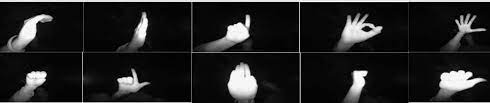

### 📍📍 About the Data

Hand gesture recognition database is presented, composed by a set of near infrared images acquired by the Leap Motion sensor.

The database is composed by 5 different hand-gestures (showed above) that were performed by 10 different subjects (5 men and 5 women).
<br>

The database is structured in different folders as:
<br>
/00 (subject with identifier 00)<br>
/01_palm (images for palm gesture of subject 00 )<br>
/01_palm/frame_197957_r.png,…,frame_198136_l.png, … (images that corresponds to different samples obtained for the palm gesture performed by the subject with identifier 00)<br>
/02_l (images for l gesture of subject 00 )<br>
'03_fist'<br>
'04_fist_moved'<br>
'05_thumb'<br>
/01<br>
/02<br>
/09 (last subject with identifier 09)

# 📌Importing Libaraies 

In [1]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
import os
import cv2
from tqdm import tqdm
import random
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow import keras
from tensorflow.math import confusion_matrix
from sklearn.metrics import classification_report
import seaborn as sns
tf.random.set_seed(3)
import glob 
import skimage as oi
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Flatten, Dense, LeakyReLU


# 📌 Loading The Data

In [2]:
folders_names = []
##'/kaggle/input/leapgestrecog/leapGestRecog/0'
for i in range(10):
    folder = r'C:\Users\user\Desktop\archive (3)\leapGestRecog\0{}'.format(i)
    folders_names.append(folder)

files_names = ['01_palm', '02_l', '03_fist', '04_fist_moved', '05_thumb']


In [3]:
folders_names

['C:\\Users\\user\\Desktop\\archive (3)\\leapGestRecog\\00',
 'C:\\Users\\user\\Desktop\\archive (3)\\leapGestRecog\\01',
 'C:\\Users\\user\\Desktop\\archive (3)\\leapGestRecog\\02',
 'C:\\Users\\user\\Desktop\\archive (3)\\leapGestRecog\\03',
 'C:\\Users\\user\\Desktop\\archive (3)\\leapGestRecog\\04',
 'C:\\Users\\user\\Desktop\\archive (3)\\leapGestRecog\\05',
 'C:\\Users\\user\\Desktop\\archive (3)\\leapGestRecog\\06',
 'C:\\Users\\user\\Desktop\\archive (3)\\leapGestRecog\\07',
 'C:\\Users\\user\\Desktop\\archive (3)\\leapGestRecog\\08',
 'C:\\Users\\user\\Desktop\\archive (3)\\leapGestRecog\\09']

### 📍📍Display 3 images for each file from eav=ch class

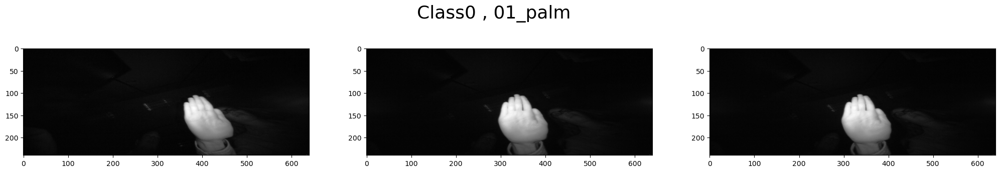

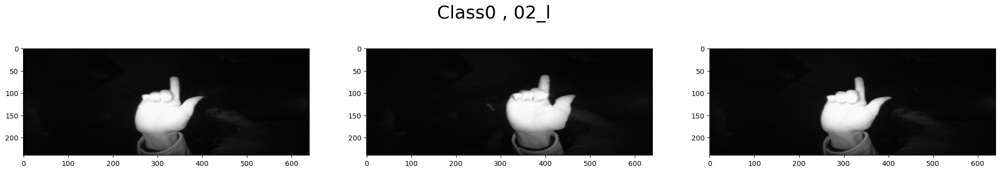

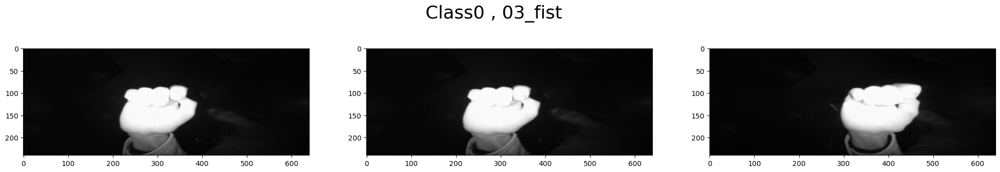

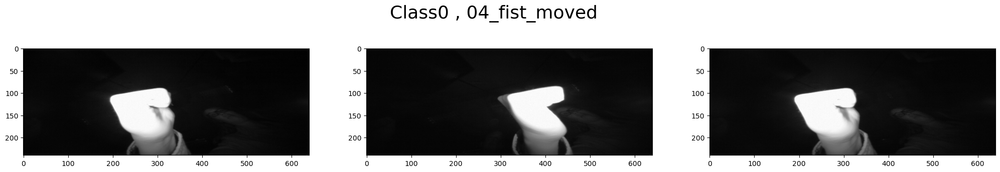

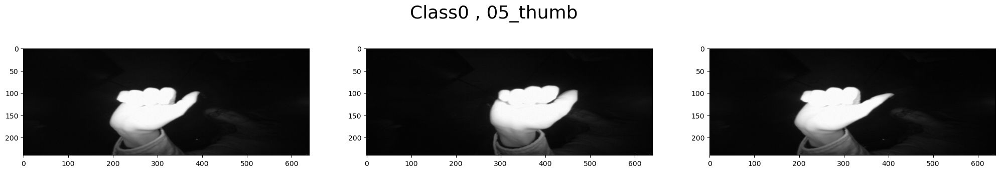

...

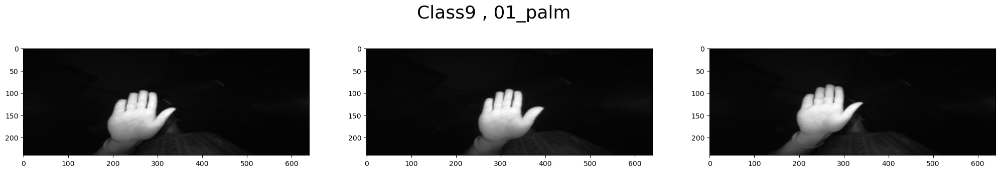

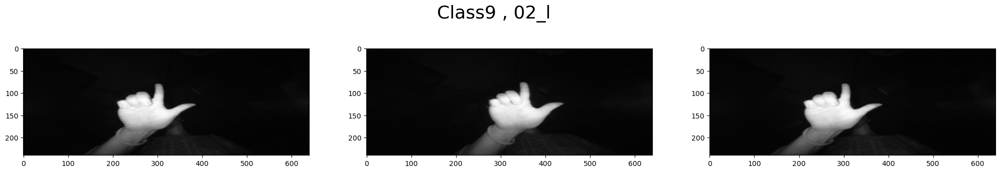

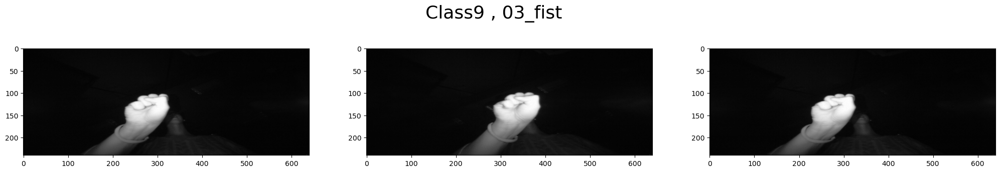

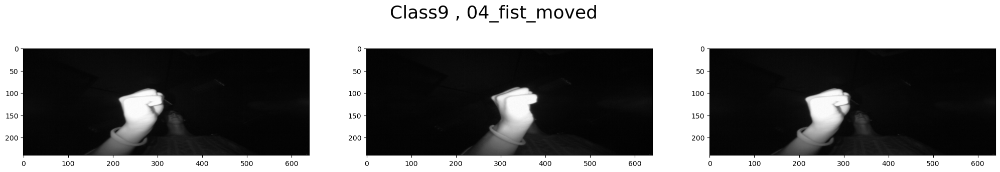

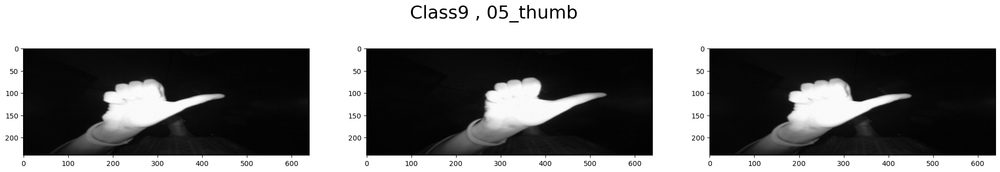

In [4]:
for folder in folders_names:
        Class_num=folder[-1]
        for file in files_names:
            path = os.path.join(folder, file)
            x=0
            fig, axes = plt.subplots(1,3, figsize=(25, 4))  
            for img in os.listdir(path):
                
                
                img_array = cv2.imread(os.path.join(path, img), cv2.IMREAD_GRAYSCALE)
                axes[x].imshow(img_array, cmap='gray')
                x += 1
                if x == 3: 
                    break

            plt.suptitle(f"Class{Class_num} , {file}", fontsize=26)
            plt.show()

### 📍📍loading 

In [5]:
training_data = []

def create_training_data():
    for folder in folders_names:
        Class_num=folder[-1]
        print('Class ' ,Class_num)
        for file in files_names:
            path = os.path.join(folder, file)

            print('Class ' ,Class_num,file)
#             c=0
            
            for img in tqdm(os.listdir(path)):
#                 if(c==100):
#                     break
#                 c+=1
                img_array = cv2.imread(os.path.join(path, img), cv2.IMREAD_GRAYSCALE)
                
          
                training_data.append([img_array,int(Class_num)])
                        
    
create_training_data()        

Class  0

Class  0 01_palm


100%|███████████████████████████████████████████████████████████████████████████████| 200/200 [00:01<00:00, 115.23it/s]


Class  0 02_l


100%|███████████████████████████████████████████████████████████████████████████████| 200/200 [00:01<00:00, 114.38it/s]


Class  0 03_fist


100%|███████████████████████████████████████████████████████████████████████████████| 200/200 [00:01<00:00, 114.60it/s]


Class  0 04_fist_moved


100%|███████████████████████████████████████████████████████████████████████████████| 200/200 [00:01<00:00, 116.64it/s]


Class  0 05_thumb


100%|███████████████████████████████████████████████████████████████████████████████| 200/200 [00:01<00:00, 114.97it/s]


Class  1

Class  1 01_palm


100%|███████████████████████████████████████████████████████████████████████████████| 200/200 [00:01<00:00, 111.80it/s]


Class  1 02_l


100%|███████████████████████████████████████████████████████████████████████████████| 200/200 [00:01<00:00, 116.63it/s]


Class  1 03_fist


100%|███████████████████████████████████████████████████████████████████████████████| 200/200 [00:01<00:00, 119.02it/s]


Class  1 04_fist_moved


100%|███████████████████████████████████████████████████████████████████████████████| 200/200 [00:01<00:00, 110.75it/s]


Class  1 05_thumb


100%|███████████████████████████████████████████████████████████████████████████████| 200/200 [00:01<00:00, 114.23it/s]


Class  2

Class  2 01_palm


100%|███████████████████████████████████████████████████████████████████████████████| 200/200 [00:01<00:00, 110.43it/s]


Class  2 02_l


100%|███████████████████████████████████████████████████████████████████████████████| 200/200 [00:01<00:00, 111.24it/s]


Class  2 03_fist


100%|███████████████████████████████████████████████████████████████████████████████| 200/200 [00:01<00:00, 113.62it/s]


Class  2 04_fist_moved


100%|███████████████████████████████████████████████████████████████████████████████| 200/200 [00:01<00:00, 117.28it/s]


Class  2 05_thumb


100%|███████████████████████████████████████████████████████████████████████████████| 200/200 [00:01<00:00, 109.60it/s]


Class  3

Class  3 01_palm


100%|███████████████████████████████████████████████████████████████████████████████| 200/200 [00:01<00:00, 112.41it/s]


Class  3 02_l


100%|███████████████████████████████████████████████████████████████████████████████| 200/200 [00:01<00:00, 116.78it/s]


Class  3 03_fist


100%|███████████████████████████████████████████████████████████████████████████████| 200/200 [00:01<00:00, 108.38it/s]


Class  3 04_fist_moved


100%|███████████████████████████████████████████████████████████████████████████████| 200/200 [00:01<00:00, 112.50it/s]


Class  3 05_thumb


100%|███████████████████████████████████████████████████████████████████████████████| 200/200 [00:01<00:00, 113.91it/s]


Class  4

Class  4 01_palm


100%|███████████████████████████████████████████████████████████████████████████████| 200/200 [00:01<00:00, 121.67it/s]


Class  4 02_l


100%|███████████████████████████████████████████████████████████████████████████████| 200/200 [00:01<00:00, 111.21it/s]


Class  4 03_fist


100%|███████████████████████████████████████████████████████████████████████████████| 200/200 [00:01<00:00, 116.31it/s]


Class  4 04_fist_moved


100%|███████████████████████████████████████████████████████████████████████████████| 200/200 [00:01<00:00, 113.97it/s]


Class  4 05_thumb


100%|███████████████████████████████████████████████████████████████████████████████| 200/200 [00:01<00:00, 106.84it/s]


Class  5

Class  5 01_palm


100%|███████████████████████████████████████████████████████████████████████████████| 200/200 [00:01<00:00, 108.44it/s]


Class  5 02_l


100%|███████████████████████████████████████████████████████████████████████████████| 200/200 [00:01<00:00, 112.36it/s]


Class  5 03_fist


100%|███████████████████████████████████████████████████████████████████████████████| 200/200 [00:01<00:00, 105.72it/s]


Class  5 04_fist_moved


100%|███████████████████████████████████████████████████████████████████████████████| 200/200 [00:01<00:00, 113.07it/s]


Class  5 05_thumb


100%|███████████████████████████████████████████████████████████████████████████████| 200/200 [00:01<00:00, 114.22it/s]


Class  6

Class  6 01_palm


100%|███████████████████████████████████████████████████████████████████████████████| 200/200 [00:01<00:00, 112.31it/s]


Class  6 02_l


100%|███████████████████████████████████████████████████████████████████████████████| 200/200 [00:01<00:00, 119.04it/s]


Class  6 03_fist


100%|███████████████████████████████████████████████████████████████████████████████| 200/200 [00:01<00:00, 125.17it/s]


Class  6 04_fist_moved


100%|███████████████████████████████████████████████████████████████████████████████| 200/200 [00:01<00:00, 123.50it/s]


Class  6 05_thumb


100%|███████████████████████████████████████████████████████████████████████████████| 200/200 [00:01<00:00, 134.96it/s]


Class  7

Class  7 01_palm


100%|███████████████████████████████████████████████████████████████████████████████| 200/200 [00:01<00:00, 123.30it/s]


Class  7 02_l


100%|███████████████████████████████████████████████████████████████████████████████| 200/200 [00:01<00:00, 122.17it/s]


Class  7 03_fist


100%|███████████████████████████████████████████████████████████████████████████████| 200/200 [00:01<00:00, 121.68it/s]


Class  7 04_fist_moved


100%|███████████████████████████████████████████████████████████████████████████████| 200/200 [00:01<00:00, 110.22it/s]


Class  7 05_thumb


100%|███████████████████████████████████████████████████████████████████████████████| 200/200 [00:01<00:00, 116.92it/s]


Class  8

Class  8 01_palm


100%|███████████████████████████████████████████████████████████████████████████████| 200/200 [00:01<00:00, 108.29it/s]


Class  8 02_l


100%|███████████████████████████████████████████████████████████████████████████████| 200/200 [00:01<00:00, 116.99it/s]


Class  8 03_fist


100%|███████████████████████████████████████████████████████████████████████████████| 200/200 [00:01<00:00, 115.05it/s]


Class  8 04_fist_moved


100%|███████████████████████████████████████████████████████████████████████████████| 200/200 [00:01<00:00, 108.71it/s]


Class  8 05_thumb


100%|███████████████████████████████████████████████████████████████████████████████| 200/200 [00:01<00:00, 113.71it/s]


Class  9

Class  9 01_palm


100%|███████████████████████████████████████████████████████████████████████████████| 200/200 [00:01<00:00, 116.57it/s]


Class  9 02_l


100%|███████████████████████████████████████████████████████████████████████████████| 200/200 [00:01<00:00, 108.90it/s]


Class  9 03_fist


100%|███████████████████████████████████████████████████████████████████████████████| 200/200 [00:01<00:00, 114.05it/s]


Class  9 04_fist_moved


100%|███████████████████████████████████████████████████████████████████████████████| 200/200 [00:01<00:00, 107.18it/s]


Class  9 05_thumb


100%|███████████████████████████████████████████████████████████████████████████████| 200/200 [00:01<00:00, 101.09it/s]


# 📌Sizes of images

### 📍📍 printing the shape of the first image from each class

In [6]:
for folder in folders_names:
    class_num = folder[-1]
    print('Class', class_num)
    for file in files_names:
        path = os.path.join(folder, file)
       
        for img in os.listdir(path):
            img_array = cv2.imread(os.path.join(path, img), cv2.IMREAD_GRAYSCALE)
            print("Image shape:", img_array.shape,"\n")
            break  # To print only the first image shape for each file
        break  # To print only the first file shape for each folder


Class 0

Image shape: (240, 640) 



Class 1

Image shape: (240, 640) 



Class 2

Image shape: (240, 640) 



Class 3

Image shape: (240, 640) 



Class 4

Image shape: (240, 640) 



Class 5

Image shape: (240, 640) 



Class 6

Image shape: (240, 640) 



Class 7

Image shape: (240, 640) 



Class 8

Image shape: (240, 640) 



Class 9

Image shape: (240, 640) 




### 📍📍 Checking if all images have the same size or not

In [7]:
def check_image_sizes():
    first_img_shape = None
    for folder in folders_names:
        for file in files_names:
            path = os.path.join(folder, file)
            for img in os.listdir(path):
                img_array = cv2.imread(os.path.join(path, img), cv2.IMREAD_GRAYSCALE)
                if first_img_shape is None:
                    first_img_shape = img_array.shape
                elif img_array.shape != first_img_shape:
                    print("Image sizes are not consistent.")
                    return False
    print("All images have the same size:", first_img_shape)
   
check_image_sizes()


All images have the same size: (240, 640)


# 📌Shuffling

### 📍📍getting the classes of the first 5 images

In [8]:
for i in range(5):
    print("Class number for image", i+1, ":", training_data[i][1])

Class number for image 1 : 0

Class number for image 2 : 0

Class number for image 3 : 0

Class number for image 4 : 0

Class number for image 5 : 0


### 📍📍getting the classes of the lastt 5 images

In [9]:
for i in range(-1, -6, -1):
    print("Class number for image", len(training_data) + i + 1, ":", training_data[i][1])

Class number for image 10000 : 9

Class number for image 9999 : 9

Class number for image 9998 : 9

Class number for image 9997 : 9

Class number for image 9996 : 9


### 📍📍Suffling and display the first 10 classes after suffling

In [10]:
random.shuffle(training_data)

for i in range(15):
    print(f"Sample {i+1}:")
    print("Class number:", training_data[i][1],"\n") 

Sample 1:

Class number: 1 



Sample 2:

Class number: 8 



Sample 3:

Class number: 4 



Sample 4:

Class number: 9 



Sample 5:

Class number: 4 



Sample 6:

Class number: 1 



Sample 7:

Class number: 9 



Sample 8:

Class number: 9 



Sample 9:

Class number: 3 



Sample 10:

Class number: 5 



Sample 11:

Class number: 2 



Sample 12:

Class number: 8 



Sample 13:

Class number: 0 



Sample 14:

Class number: 2 



Sample 15:

Class number: 1 




# 📌Preprocessing

### 📍📍Feature Selection

In [11]:
X=[]
y=[]

for feature,label in training_data:
    X.append(feature)
    y.append(label)


In [12]:
print(type(X))
print(type(y))


<class 'list'>

<class 'list'>


### 📍📍Convert X ,y from list to numpy array

In [13]:
X=np.array(X)
y=np.array(y)
print(X.shape)
print(y.shape)

(10000, 240, 640)

(10000,)


### 📍📍Spliting the Data

In [14]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

(8000, 240, 640)

(8000,)

(2000, 240, 640)

(2000,)


### 📍📍Getting classes names

In [15]:
print(np.unique(y_train))

print(np.unique(y_test))

[0 1 2 3 4 5 6 7 8 9]

[0 1 2 3 4 5 6 7 8 9]


### 📍📍Scalling the Data

In [16]:
X_train = X_train/255
X_test = X_test/255

### 📍📍print first image after scalling 

In [17]:
print(X_train[0])

[[0.01960784 0.01960784 0.02745098 ... 0.01568627 0.01568627 0.01960784]

 [0.01960784 0.01568627 0.01568627 ... 0.01960784 0.00784314 0.01568627]

 [0.02352941 0.01568627 0.02352941 ... 0.01960784 0.01568627 0.01568627]

 ...

 [0.01568627 0.01960784 0.01568627 ... 0.01176471 0.01176471 0.01176471]

 [0.01960784 0.01960784 0.01960784 ... 0.01960784 0.01568627 0.01176471]

 [0.01568627 0.02352941 0.02745098 ... 0.09803922 0.04705882 0.0627451 ]]


# 📌Modeling Time

### 📍📍Building Multi Neural Network

In [37]:

model = Sequential([
    Flatten(input_shape=(240, 640)),
#     Dense(1024),
#     LeakyReLU(alpha=0.1),
#     Dense(512),
#     LeakyReLU(alpha=0.1),
#     Dense(256),
#     LeakyReLU(alpha=0.1),
#     Dense(128),
#     LeakyReLU(alpha=0.1),
    Dense(64),
    LeakyReLU(alpha=0.1),
    Dense(32),
    LeakyReLU(alpha=0.1),
    Dense(16),
    LeakyReLU(alpha=0.1),
    Dense(10, activation='softmax')
])

### 📍📍Compiling the model

In [38]:
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

### 📍📍Training the Neural Network

In [39]:
history = model.fit(X_train, y_train, epochs=3, validation_split=0.1, batch_size=32, verbose=2)


Epoch 1/3

225/225 - 25s - loss: 1.1697 - accuracy: 0.6862 - val_loss: 0.3792 - val_accuracy: 0.8725 - 25s/epoch - 113ms/step

Epoch 2/3

225/225 - 16s - loss: 0.1226 - accuracy: 0.9749 - val_loss: 0.0391 - val_accuracy: 0.9987 - 16s/epoch - 70ms/step

Epoch 3/3

225/225 - 16s - loss: 0.0163 - accuracy: 0.9986 - val_loss: 0.0090 - val_accuracy: 1.0000 - 16s/epoch - 70ms/step


### 📍📍 Model Summary

In [40]:
model.summary()

Model: "sequential_2"

_________________________________________________________________

 Layer (type)                Output Shape              Param #   


 flatten_2 (Flatten)         (None, 153600)            0         

                                                                 

 dense_10 (Dense)            (None, 64)                9830464   

                                                                 

 leaky_re_lu_8 (LeakyReLU)   (None, 64)                0         

                                                                 

 dense_11 (Dense)            (None, 32)                2080      

                                                                 

 leaky_re_lu_9 (LeakyReLU)   (None, 32)                0         

                                                                 

 dense_12 (Dense)            (None, 16)                528       

                                                                 

 leaky_re_lu_10 (LeakyReLU)  (None, 16

# 📌Evaluation time

### 📍📍Training Loss

In [41]:
loss, accuracy = model.evaluate(X_train, y_train)
print(f"Training Loss: {loss:.4f}")
print(f"Training Accuracy: {accuracy*100:.2f}%")


250/250 [==============================] - 4s 12ms/step - loss: 0.0091 - accuracy: 0.9995

Training Loss: 0.0091

Training Accuracy: 99.95%


### 📍📍Testing Loss

In [51]:
loss, accuracy = model.evaluate(X_test, y_test)
print(f"Testing Loss: {loss:.4f}")
print(f"Testing Loss : {accuracy*100:.2f} %")

63/63 [==============================] - 1s 10ms/step - loss: 0.0096 - accuracy: 0.9995

Testing Loss: 0.0096

Testing Loss : 99.95 %


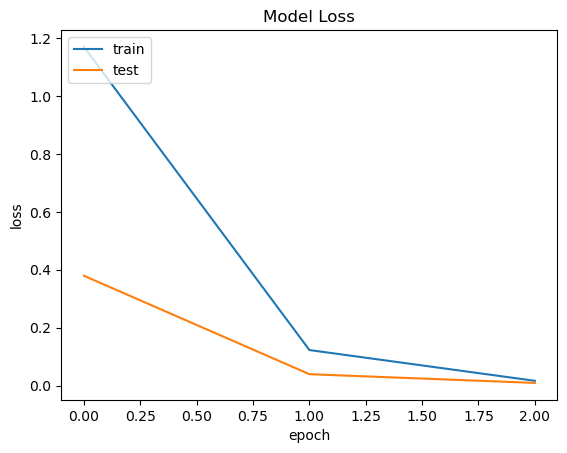

In [43]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

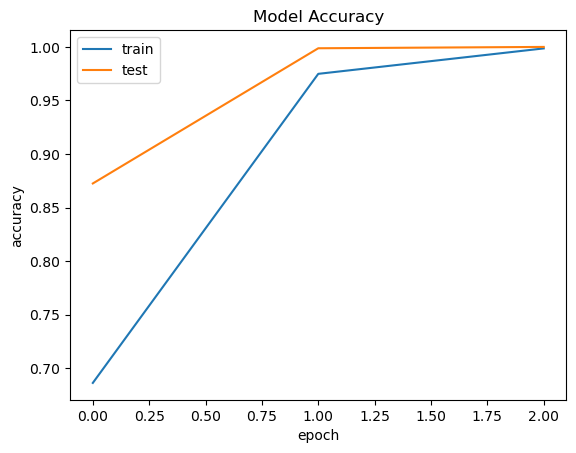

In [44]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.xlabel('epoch')
plt.ylabel('accuracy')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

### 📍📍Prediction

In [45]:
y_pred=model.predict(X_test)
print(y_pred[0])

63/63 [==============================] - 1s 11ms/step

[7.1448518e-04 1.1229745e-09 1.4269098e-06 9.6791011e-01 7.4209581e-04

 1.3693235e-03 1.3667109e-03 1.4450976e-04 9.2422944e-03 1.8509133e-02]


In [46]:
y_pred = [np.argmax(i) for i in y_pred]
print(y_pred[1])

0


### 📍📍y_test Vs y_pred

In [47]:
comparison_df = pd.DataFrame({ 'Actual': y_test,'Predicted': y_pred})

print(comparison_df[:20])

    Actual  Predicted

0        3          3

1        0          0

2        2          2

3        7          7

4        9          9

5        9          9

6        4          4

7        7          7

8        0          0

9        3          3

10       2          2

11       6          6

12       3          3

13       5          5

14       8          8

15       3          3

16       5          5

17       2          2

18       8          8

19       3          3


### 📍📍 Confusion Matrix

In [48]:
conf_mat = confusion_matrix(y_test, y_pred)
print(conf_mat)

tf.Tensor(

[[201   0   0   0   0   0   0   0   0   0]

 [  0 183   0   0   0   0   0   0   0   0]

 [  0   0 189   0   0   0   0   0   0   0]

 [  0   0   0 209   0   0   0   0   0   0]

 [  0   0   0   0 201   0   0   0   0   0]

 [  0   0   0   0   0 199   0   0   0   0]

 [  0   0   0   0   0   0 223   0   0   0]

 [  0   0   0   0   0   0   0 216   0   0]

 [  0   0   0   0   0   0   0   0 190   0]

 [  0   0   0   1   0   0   0   0   0 188]], shape=(10, 10), dtype=int32)


Text(0.5, 47.7222222222222, 'Predicted Labels')

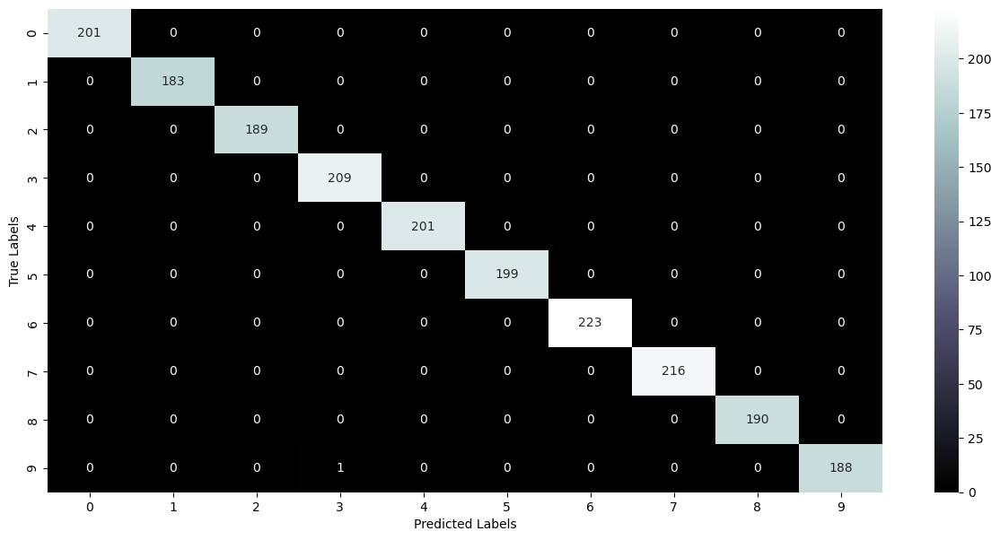

In [49]:
plt.figure(figsize=(15,7))
sns.heatmap(conf_mat, annot=True, fmt='d', cmap='bone')
plt.ylabel('True Labels')
plt.xlabel('Predicted Labels')

### 📍📍 Classification Report 

In [50]:
from sklearn.metrics import classification_report

print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support



           0       1.00      1.00      1.00       201

           1       1.00      1.00      1.00       183

           2       1.00      1.00      1.00       189

           3       1.00      1.00      1.00       209

           4       1.00      1.00      1.00       201

           5       1.00      1.00      1.00       199

           6       1.00      1.00      1.00       223

           7       1.00      1.00      1.00       216

           8       1.00      1.00      1.00       190

           9       1.00      0.99      1.00       189



    accuracy                           1.00      2000

   macro avg       1.00      1.00      1.00      2000

weighted avg       1.00      1.00      1.00      2000




## Wish U luck 💗
### Esraa Meslam